In [1]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.8/194.8 kB 8.9 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [2]:
from datasets import load_dataset
import pandas as pd

# Load the CelebA-HQ dataset
ds = load_dataset("saitsharipov/CelebA-HQ")

# Check if dataset loaded correctly
if ds is None:
    raise ValueError("Dataset not loaded correctly")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/224 [00:00<?, ?B/s]

(…)-00000-of-00003-30fbdf94a5d8e722.parquet:   0%|          | 0.00/464M [00:00<?, ?B/s]

(…)-00001-of-00003-74b418aa7a721747.parquet:   0%|          | 0.00/464M [00:00<?, ?B/s]

(…)-00002-of-00003-4f9459a488896f53.parquet:   0%|          | 0.00/465M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/202599 [00:00<?, ? examples/s]

Dataset structure:
DatasetDict({
    train: Dataset({
        features: ['image'],
        num_rows: 202599
    })
})

First few items in the training set:
Item 0:
  image: Image with shape (178, 218)


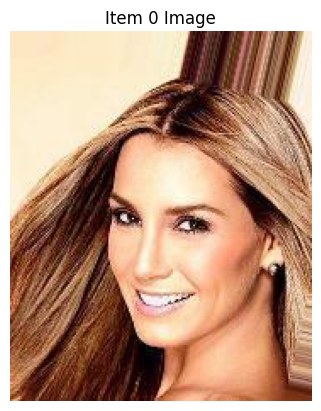


Item 1:
  image: Image with shape (178, 218)


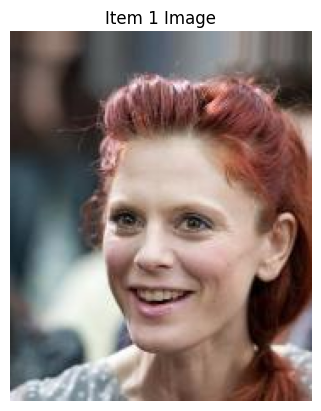


Item 2:
  image: Image with shape (178, 218)


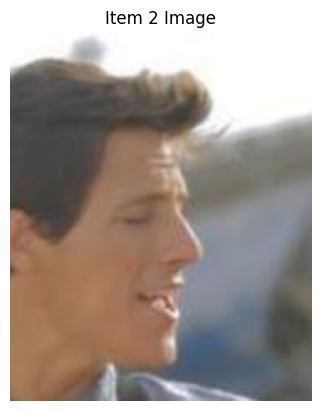


Item 3:
  image: Image with shape (178, 218)


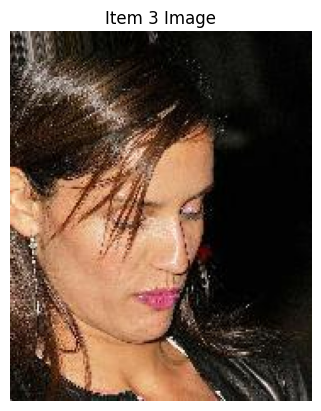


Item 4:
  image: Image with shape (178, 218)


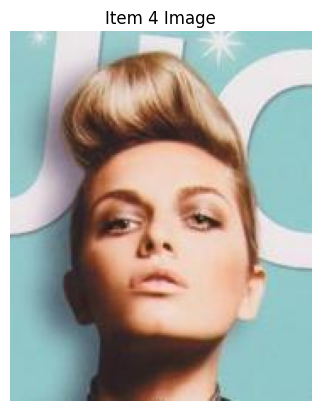



Column names:
['image']

DataFrame head:
                                               image
0  <PIL.JpegImagePlugin.JpegImageFile image mode=...
1  <PIL.JpegImagePlugin.JpegImageFile image mode=...
2  <PIL.JpegImagePlugin.JpegImageFile image mode=...
3  <PIL.JpegImagePlugin.JpegImageFile image mode=...
4  <PIL.JpegImagePlugin.JpegImageFile image mode=...

Column data types:
image    object
dtype: object


In [3]:
from datasets import load_dataset
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

# Load the CelebA-HQ dataset
try:
    ds = load_dataset("saitsharipov/CelebA-HQ")
except Exception as e:
    print(f"Error loading dataset: {e}")
    exit()

# Print basic information about the dataset
print("Dataset structure:")
print(ds)

# Inspect the first few items in the training set
print("\nFirst few items in the training set:")
for i, item in enumerate(ds['train'].take(5)):
    print(f"Item {i}:")
    for key, value in item.items():
        if key == 'image':
            print(f"  {key}: Image with shape {value.size}")
            # Display the image
            plt.imshow(value)
            plt.title(f"Item {i} Image")
            plt.axis('off')
            plt.show()
        else:
            print(f"  {key}: {value}")
    print()

# Get all column names (attributes)
column_names = list(ds['train'].features.keys())
print("\nColumn names:")
print(column_names)

# Convert a small subset of the dataset to a pandas DataFrame for easier inspection
df = pd.DataFrame(ds['train'].select(range(100)))
print("\nDataFrame head:")
print(df.head())

# Print data types of columns
print("\nColumn data types:")
print(df.dtypes)

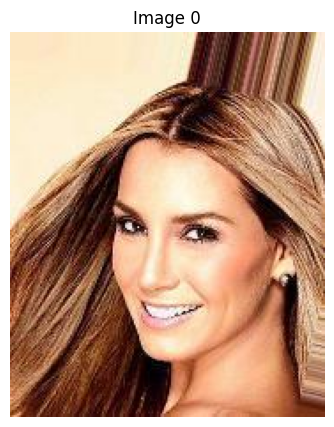

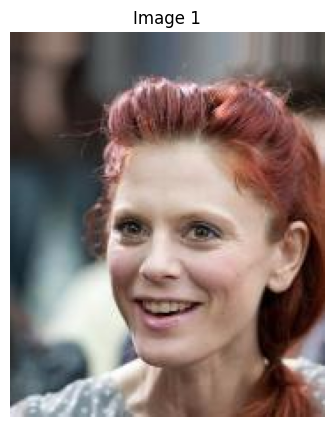

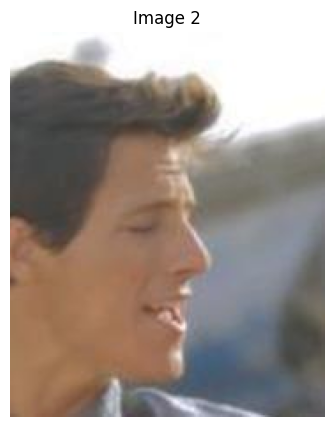

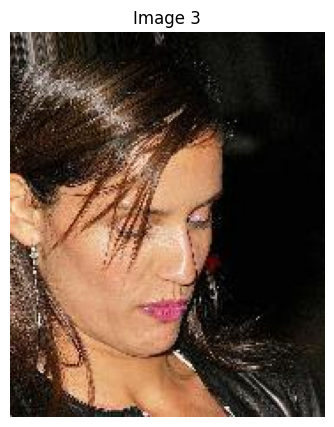

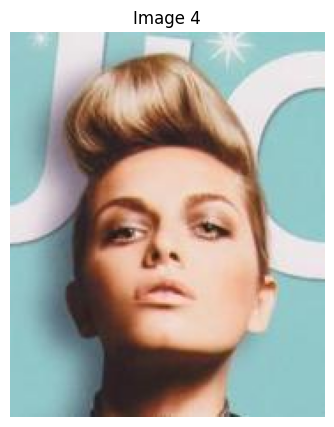

In [4]:
import matplotlib.pyplot as plt

# Display the first 5 images
for i, item in enumerate(ds['train'].take(5)):
    plt.figure(figsize=(5, 5))
    plt.imshow(item['image'])
    plt.title(f"Image {i}")
    plt.axis('off')
    plt.show()

In [5]:
for i, item in enumerate(ds['train'].take(5)):
    print(f"Image {i}:")
    print(f"  Size: {item['image'].size}")
    print(f"  Mode: {item['image'].mode}")
    print(f"  Format: {item['image'].format}")

Image 0:
  Size: (178, 218)
  Mode: RGB
  Format: JPEG
Image 1:
  Size: (178, 218)
  Mode: RGB
  Format: JPEG
Image 2:
  Size: (178, 218)
  Mode: RGB
  Format: JPEG
Image 3:
  Size: (178, 218)
  Mode: RGB
  Format: JPEG
Image 4:
  Size: (178, 218)
  Mode: RGB
  Format: JPEG


In [6]:
import numpy as np

# Convert the first image to a NumPy array
image_array = np.array(ds['train'][0]['image'])
print(f"Image array shape: {image_array.shape}")
print(f"Image array:\n{image_array}")

Image array shape: (218, 178, 3)
Image array:
[[[253 231 194]
  [253 231 194]
  [253 231 194]
  ...
  [246 228 216]
  [255 237 223]
  [254 238 222]]

 [[253 231 194]
  [253 231 194]
  [253 231 194]
  ...
  [248 230 218]
  [255 237 223]
  [254 238 222]]

 [[253 231 194]
  [253 231 194]
  [253 231 194]
  ...
  [250 232 220]
  [255 238 224]
  [255 239 223]]

 ...

 [[140  74  26]
  [115  49   1]
  [146  78  33]
  ...
  [122  55  28]
  [123  56  30]
  [122  56  30]]

 [[130  62  15]
  [138  70  23]
  [166  98  53]
  ...
  [118  49  20]
  [120  50  24]
  [118  51  24]]

 [[168 100  53]
  [204 136  89]
  [245 177 132]
  ...
  [118  49  20]
  [120  50  24]
  [120  50  24]]]


In [7]:
from torchvision import transforms

# Define a transformation to resize images
transform = transforms.Compose([
    transforms.Resize((128, 128)),  # Resize to 128x128
    transforms.ToTensor(),          # Convert to tensor
])

# Apply the transformation to the first image
image_resized = transform(ds['train'][0]['image'])
print(f"Resized image shape: {image_resized.shape}")

Resized image shape: torch.Size([3, 128, 128])


In [8]:
import os

# Create a directory to save images
os.makedirs("celeba_images", exist_ok=True)

# Save the first 10 images
for i, item in enumerate(ds['train'].take(10)):
    item['image'].save(f"celeba_images/image_{i}.jpg")

In [9]:
# Compute mean and standard deviation of pixel values
pixel_values = np.array([np.array(item['image']) for item in ds['train'].take(1000)])
mean = np.mean(pixel_values, axis=(0, 1, 2)) / 255
std = np.std(pixel_values, axis=(0, 1, 2)) / 255

print(f"Mean: {mean}")
print(f"Standard Deviation: {std}")

Mean: [0.51233411 0.43074377 0.38637948]
Standard Deviation: [0.31153927 0.29096617 0.29042072]


In [10]:
def create_irregular_mask(image_size, max_vertices=8, max_brush_width=30):
    """
    Create an irregular mask with random shapes.

    Args:
        image_size (tuple): Size of the image (height, width).
        max_vertices (int): Maximum number of vertices for random polygons.
        max_brush_width (int): Maximum brush width for drawing shapes.

    Returns:
        mask (numpy.ndarray): Binary mask (0 for masked regions, 1 for unmasked regions).
    """
    mask = np.ones(image_size, dtype=np.uint8)  # Start with a fully unmasked image

    # Draw random shapes
    num_shapes = np.random.randint(1, 5)  # Number of random shapes
    for _ in range(num_shapes):
        # Random vertices for a polygon
        vertices = np.random.randint(0, max(image_size), size=(np.random.randint(3, max_vertices), 2))
        # Draw the polygon on the mask
        cv2.fillPoly(mask, [vertices], color=0)

        # Draw random lines
        for _ in range(np.random.randint(1, 3)):
            pt1 = tuple(np.random.randint(0, max(image_size), size=2))
            pt2 = tuple(np.random.randint(0, max(image_size), size=2))
            cv2.line(mask, pt1, pt2, color=0, thickness=np.random.randint(1, max_brush_width))

    return mask

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

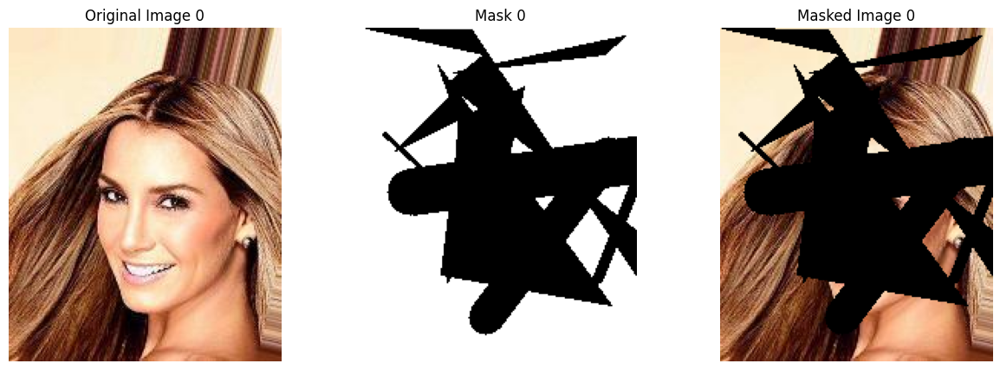

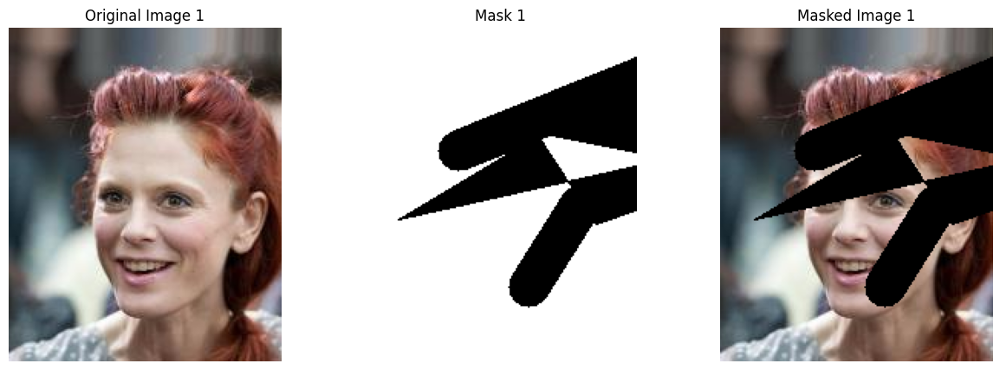

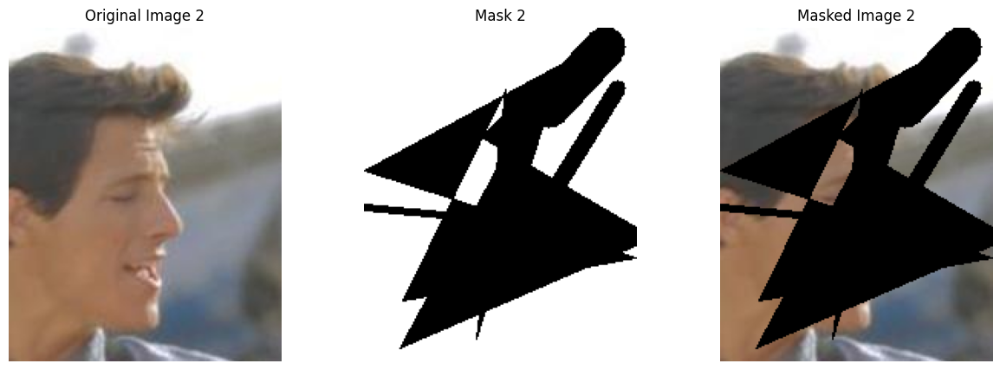

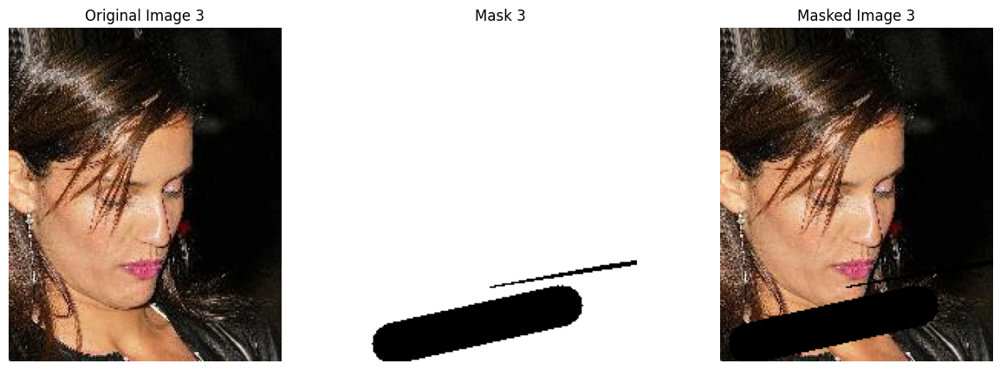

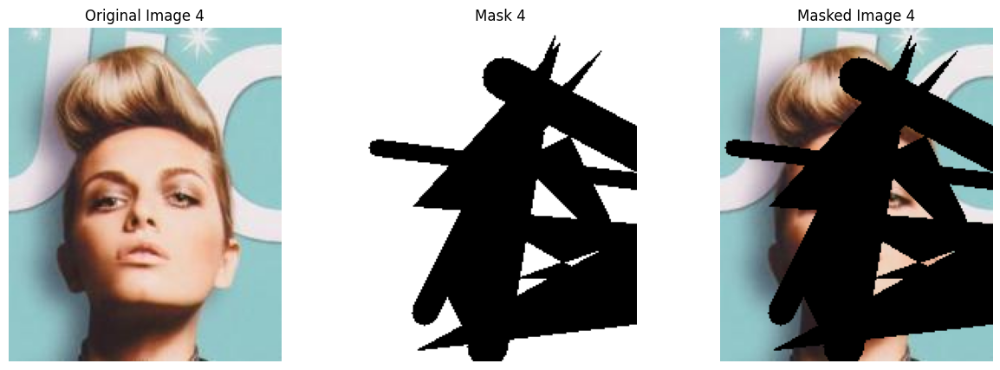

In [12]:
# Display the first 5 images with irregular masks
for i, item in enumerate(ds['train'].take(5)):
    image = np.array(item['image'])  # Convert PIL image to NumPy array
    mask = create_irregular_mask(image.shape[:2])  # Create mask

    # Apply the mask to the image
    masked_image = image * mask[:, :, np.newaxis]  # Multiply image with mask

    # Display the original image, mask, and masked image
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title(f"Original Image {i}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(mask, cmap='gray')
    plt.title(f"Mask {i}")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(masked_image)
    plt.title(f"Masked Image {i}")
    plt.axis('off')

    plt.show()

In [13]:
!pip install diffusers transformers torch datasets

In [14]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Not this version

In [17]:
import numpy as np
import cv2
from datasets import load_dataset

# Load the CelebA-HQ dataset
ds = load_dataset("saitsharipov/CelebA-HQ")

def create_irregular_mask(image_size, max_vertices=8, max_brush_width=30):
    """
    Create an irregular mask with random shapes.

    Args:
        image_size (tuple): Size of the image (height, width).
        max_vertices (int): Maximum number of vertices for random polygons.
        max_brush_width (int): Maximum brush width for drawing shapes.

    Returns:
        mask (numpy.ndarray): Binary mask (0 for masked regions, 1 for unmasked regions).
    """
    mask = np.ones(image_size, dtype=np.uint8)  # Start with a fully unmasked image

    # Draw random shapes
    num_shapes = np.random.randint(1, 5)  # Number of random shapes
    for _ in range(num_shapes):
        # Random vertices for a polygon
        vertices = np.random.randint(0, max(image_size), size=(np.random.randint(3, max_vertices), 2))
        # Draw the polygon on the mask
        cv2.fillPoly(mask, [vertices], color=0)

        # Draw random lines
        for _ in range(np.random.randint(1, 3)):
            pt1 = tuple(np.random.randint(0, max(image_size), size=2))
            pt2 = tuple(np.random.randint(0, max(image_size), size=2))
            cv2.line(mask, pt1, pt2, color=0, thickness=np.random.randint(1, max_brush_width))

    return mask

In [18]:
from diffusers import StableDiffusionInpaintPipeline
import torch

# Load the pretrained inpainting model
pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-inpainting",
    torch_dtype=torch.float16,
).to("cuda")

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [19]:
import os
from torchvision import transforms
from PIL import Image

# Define the checkpoint directory
checkpoint_dir = "/content/drive/MyDrive/checkpoints"
os.makedirs(checkpoint_dir, exist_ok=True)

# Define a transformation to resize images
transform = transforms.Compose([
    transforms.Resize((512, 512)),  # Resize to 512x512
    transforms.ToTensor(),          # Convert to tensor
])

# Number of epochs
num_epochs = 1

# Number of images to process
num_images = 1000

# Training loop
for epoch in range(num_epochs):
    print(f"Epoch {epoch + 1}/{num_epochs}")
    for i in range(num_images):
        # Load the image
        image = ds['train'][i]['image']
        image = transform(image).unsqueeze(0).to("cuda")

        # Create a mask
        mask = create_irregular_mask((512, 512))
        mask = transforms.ToTensor()(mask).unsqueeze(0).to("cuda")

        # Perform inpainting
        with torch.autocast("cuda"):
            inpainted_image = pipe(
                prompt="",  # You can add a prompt if needed
                image=image,
                mask_image=mask,
            ).images[0]

        # Save the inpainted image
        inpainted_image.save(f"{checkpoint_dir}/epoch_{epoch + 1}_image_{i}.jpg")

    # Save checkpoint
    torch.save(pipe.state_dict(), f"{checkpoint_dir}/epoch_{epoch + 1}_checkpoint.pt")
    print(f"Checkpoint saved for epoch {epoch + 1}")

print("Training complete!")

Epoch 1/1


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
import cv2
import numpy as np
import torch
from diffusers import StableDiffusionInpaintPipeline
from torchvision import transforms
from PIL import Image
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import os

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Initialize pipeline
pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-inpainting",
    torch_dtype=torch.float16,
).to("cuda")

# Configuration
checkpoint_dir = "/content/drive/MyDrive/checkpoints"
batch_size = 10  # Process 10 images at a time
num_images = 100
os.makedirs(checkpoint_dir, exist_ok=True)

# Transformations
resize_transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
])

# Evaluation metrics storage
metrics = {'psnr': [], 'ssim': []}

def calculate_metrics(original, reconstructed):
    original = np.array(original).astype(np.float32)/255.0
    reconstructed = np.array(reconstructed).astype(np.float32)/255.0
    p = psnr(original, reconstructed)
    s = ssim(original, reconstructed, multichannel=True, channel_axis=2)
    return p, s

# Processing loop
for batch_start in range(0, num_images, batch_size):
    batch_end = min(batch_start + batch_size, num_images)
    print(f"Processing images {batch_start}-{batch_end-1}")

    batch_metrics = {'psnr': [], 'ssim': []}

    for i in range(batch_start, batch_end):
        try:
            # Load and prepare image
            orig_image = ds['train'][i]['image']
            image = resize_transform(orig_image).unsqueeze(0).half().to("cuda")

            # Create mask (1 = valid, 0 = masked)
            mask = create_irregular_mask((512, 512))
            mask_tensor = transforms.ToTensor()(mask).unsqueeze(0).to("cuda")

            # Inpainting
            with torch.autocast("cuda"):
                result = pipe(
                    prompt="high quality portrait",  # Experiment with prompts
                    image=image.squeeze().permute(1,2,0).cpu().numpy(),
                    mask_image=mask,
                    height=512,
                    width=512,
                    num_inference_steps=20
                ).images[0]

            # Convert to same size for metrics calculation
            orig_resized = orig_image.resize((512, 512))

            # Calculate metrics only on masked regions
            mask_np = mask.astype(bool)
            p, s = calculate_metrics(
                np.array(orig_resized)[mask_np],
                np.array(result)[mask_np]
            )

            batch_metrics['psnr'].append(p)
            batch_metrics['ssim'].append(s)

            # Save sample images
            if i % 10 == 0:
                composite = Image.new('RGB', (1024, 512))
                composite.paste(orig_resized, (0, 0))
                composite.paste(Image.fromarray(mask*255), (512, 0))
                composite.paste(result, (768, 0))
                composite.save(f"{checkpoint_dir}/sample_{i}.jpg")

        except Exception as e:
            print(f"Error processing image {i}: {str(e)}")

    # Update metrics
    metrics['psnr'].extend(batch_metrics['psnr'])
    metrics['ssim'].extend(batch_metrics['ssim'])

    # Save batch checkpoint
    checkpoint = {
        'last_processed': batch_end,
        'metrics': metrics
    }
    torch.save(checkpoint, f"{checkpoint_dir}/batch_{batch_end}.pt")

    # Save pipeline state
    pipe.save_pretrained(f"{checkpoint_dir}/pipeline_{batch_end}")

    print(f"Batch {batch_end} completed. Avg PSNR: {np.mean(batch_metrics['psnr']):.2f}, SSIM: {np.mean(batch_metrics['ssim']):.2f}")

print("Processing complete!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Processing images 0-9
Error processing image 0: name 'ds' is not defined
Error processing image 1: name 'ds' is not defined
Error processing image 2: name 'ds' is not defined
Error processing image 3: name 'ds' is not defined
Error processing image 4: name 'ds' is not defined
Error processing image 5: name 'ds' is not defined
Error processing image 6: name 'ds' is not defined
Error processing image 7: name 'ds' is not defined
Error processing image 8: name 'ds' is not defined
Error processing image 9: name 'ds' is not defined


# but this version

In [16]:
# Step 1: Install required packages
!pip install datasets diffusers transformers torch accelerate scikit-image

# Step 2: Import libraries
import cv2
import numpy as np
import torch
from PIL import Image
from datasets import load_dataset
from diffusers import StableDiffusionInpaintPipeline
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from torchvision import transforms
import matplotlib.pyplot as plt
from google.colab import drive

# Step 3: Mount Google Drive (for Colab)
drive.mount('/content/drive')

# Step 4: Load dataset
try:
    ds = load_dataset("saitsharipov/CelebA-HQ")
except Exception as e:
    print(f"Error loading dataset: {e}")
    exit()

# Step 5: Define mask creation function
def create_irregular_mask(image_size, max_vertices=8, max_brush_width=30):
    """Generate random irregular mask"""
    mask = np.ones(image_size, dtype=np.uint8)

    # Random polygons
    num_shapes = np.random.randint(1, 5)
    for _ in range(num_shapes):
        vertices = np.random.randint(0, max(image_size),
                    size=(np.random.randint(3, max_vertices), 2))
        cv2.fillPoly(mask, [vertices], color=0)

        # Random lines
        for _ in range(np.random.randint(1, 3)):
            pt1 = tuple(np.random.randint(0, max(image_size), size=2))
            pt2 = tuple(np.random.randint(0, max(image_size), size=2))
            cv2.line(mask, pt1, pt2, color=0,
                    thickness=np.random.randint(1, max_brush_width))

    return mask

# Step 6: Initialize inpainting pipeline
pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-inpainting",
    torch_dtype=torch.float16,
).to("cuda")

# Step 7: Configuration
config = {
    "image_size": 512,
    "num_images": 100,
    "checkpoint_dir": "/content/drive/MyDrive/inpainting_checkpoints",
    "batch_size": 10,
    "num_inference_steps": 30
}

# Create output directory
os.makedirs(config['checkpoint_dir'], exist_ok=True)

# Step 8: Define metrics calculation with error handling
def calculate_metrics(original, reconstructed, mask):
    """Calculate PSNR and SSIM with safety checks"""
    original_np = np.array(original).astype(np.float32) / 255.0
    reconstructed_np = np.array(reconstructed).astype(np.float32) / 255.0
    mask_np = mask.astype(bool)

    # Check for empty mask
    if not np.any(mask_np):
        return np.nan, np.nan

    # Calculate PSNR
    try:
        p = psnr(original_np[mask_np], reconstructed_np[mask_np])
    except:
        p = np.nan

    # Calculate SSIM with dynamic window size
    try:
        min_side = min(original_np.shape[:2])
        win_size = min(7, min_side - 2) if min_side > 7 else 3
        win_size = win_size if (win_size % 2 == 1) else 3

        s = ssim(original_np,
                reconstructed_np,
                win_size=win_size,
                channel_axis=2,
                data_range=1.0)
    except:
        s = np.nan

    return p, s

# Step 9: Processing pipeline
def run_inpainting_pipeline():
    metrics = {'psnr': [], 'ssim': []}
    transform = transforms.Compose([
        transforms.Resize(config['image_size']),
        transforms.CenterCrop(config['image_size']),
        transforms.ToTensor()
    ])

    for idx in range(config['num_images']):
        try:
            # Load and process image
            orig_image = ds['train'][idx]['image']
            img_tensor = transform(orig_image).unsqueeze(0).half().to("cuda")

            # Create mask
            mask = create_irregular_mask((config['image_size'], config['image_size']))
            mask_pil = Image.fromarray(mask * 255).convert("L")

            # Inpainting
            result = pipe(
                prompt="high quality human face portrait",
                image=orig_image.resize((config['image_size'], config['image_size'])),
                mask_image=mask_pil,
                height=config['image_size'],
                width=config['image_size'],
                num_inference_steps=config['num_inference_steps']
            ).images[0]

            # Calculate metrics
            p, s = calculate_metrics(
                orig_image.resize((config['image_size'], config['image_size'])),
                result,
                mask
            )

            # Store metrics
            if not np.isnan(p): metrics['psnr'].append(p)
            if not np.isnan(s): metrics['ssim'].append(s)

            # Save visualization
            if idx % 10 == 0:
                fig, axs = plt.subplots(1, 3, figsize=(15, 5))
                axs[0].imshow(orig_image)
                axs[0].set_title('Original')
                axs[1].imshow(mask, cmap='gray')
                axs[1].set_title('Mask')
                axs[2].imshow(result)
                axs[2].set_title('Inpainted')
                plt.savefig(f"{config['checkpoint_dir']}/result_{idx}.png")
                plt.close()

            print(f"Processed {idx+1}/{config['num_images']} - PSNR: {p:.2f}, SSIM: {s:.4f}")

        except Exception as e:
            print(f"Error processing image {idx}: {str(e)}")

    # Save final results
    torch.save(metrics, f"{config['checkpoint_dir']}/final_metrics.pt")
    pipe.save_pretrained(f"{config['checkpoint_dir']}/final_model")

    # Calculate final averages
    def safe_average(values):
        valid = [v for v in values if not np.isnan(v)]
        return np.mean(valid) if valid else np.nan

    print(f"\nFinal Results:")
    print(f"Average PSNR: {safe_average(metrics['psnr']):.2f}")
    print(f"Average SSIM: {safe_average(metrics['ssim']):.4f}")

# Step 10: Run the pipeline
run_inpainting_pipeline()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

Processed 1/100 - PSNR: 8.67, SSIM: 0.4406


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 2/100 - PSNR: 14.02, SSIM: 0.6817


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 3/100 - PSNR: 13.59, SSIM: 0.6932


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 4/100 - PSNR: 9.28, SSIM: 0.1717


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 5/100 - PSNR: 11.23, SSIM: 0.5610


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 6/100 - PSNR: 12.24, SSIM: 0.6224


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 7/100 - PSNR: 8.67, SSIM: 0.4898


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 8/100 - PSNR: 10.20, SSIM: 0.5099


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 9/100 - PSNR: 14.84, SSIM: 0.4931


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 10/100 - PSNR: 10.70, SSIM: 0.4521


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 11/100 - PSNR: 9.69, SSIM: 0.7357


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 12/100 - PSNR: 13.69, SSIM: 0.5705


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 13/100 - PSNR: 12.62, SSIM: 0.5162


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 14/100 - PSNR: 11.80, SSIM: 0.5232


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 15/100 - PSNR: 12.45, SSIM: 0.6971


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 16/100 - PSNR: 10.26, SSIM: 0.6805


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 17/100 - PSNR: 13.79, SSIM: 0.7275


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 18/100 - PSNR: 8.74, SSIM: 0.3692


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 19/100 - PSNR: 15.81, SSIM: 0.7349


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 20/100 - PSNR: 11.14, SSIM: 0.6113


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 21/100 - PSNR: 8.76, SSIM: 0.3625


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 22/100 - PSNR: 12.39, SSIM: 0.5023


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 23/100 - PSNR: 11.30, SSIM: 0.5420


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 24/100 - PSNR: 11.12, SSIM: 0.4212


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 25/100 - PSNR: 13.61, SSIM: 0.6218


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 26/100 - PSNR: 13.15, SSIM: 0.5138


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 27/100 - PSNR: 15.03, SSIM: 0.5828


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 28/100 - PSNR: 15.88, SSIM: 0.6669


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 29/100 - PSNR: 8.91, SSIM: 0.4743


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 30/100 - PSNR: 8.18, SSIM: 0.3995


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 31/100 - PSNR: 13.13, SSIM: 0.5816


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 32/100 - PSNR: 9.51, SSIM: 0.4164


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 33/100 - PSNR: 15.94, SSIM: 0.6567


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 34/100 - PSNR: 15.12, SSIM: 0.7310


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 35/100 - PSNR: 14.49, SSIM: 0.5612


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 36/100 - PSNR: 11.99, SSIM: 0.5746


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 37/100 - PSNR: 17.59, SSIM: 0.7766


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 38/100 - PSNR: 10.47, SSIM: 0.5343


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 39/100 - PSNR: 12.57, SSIM: 0.6049


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 40/100 - PSNR: 15.54, SSIM: 0.6687


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 41/100 - PSNR: 14.49, SSIM: 0.6613


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 42/100 - PSNR: 10.05, SSIM: 0.5792


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 43/100 - PSNR: 12.70, SSIM: 0.6335


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 44/100 - PSNR: 10.63, SSIM: 0.3902


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 45/100 - PSNR: 11.56, SSIM: 0.5320


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 46/100 - PSNR: 11.58, SSIM: 0.7359


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 47/100 - PSNR: 9.67, SSIM: 0.6735


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 48/100 - PSNR: 6.15, SSIM: 0.3830


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 49/100 - PSNR: 15.04, SSIM: 0.8088


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 50/100 - PSNR: 10.17, SSIM: 0.5553


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 51/100 - PSNR: 12.10, SSIM: 0.6350


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 52/100 - PSNR: 13.22, SSIM: 0.6429


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 53/100 - PSNR: 11.25, SSIM: 0.4599


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 54/100 - PSNR: 10.28, SSIM: 0.4789


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 55/100 - PSNR: 11.53, SSIM: 0.5882


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 56/100 - PSNR: 12.96, SSIM: 0.7277


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 57/100 - PSNR: 12.49, SSIM: 0.5369


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 58/100 - PSNR: 11.58, SSIM: 0.5733


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 59/100 - PSNR: 15.96, SSIM: 0.6652


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 60/100 - PSNR: 11.14, SSIM: 0.3999


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 61/100 - PSNR: 10.88, SSIM: 0.6485


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 62/100 - PSNR: 10.55, SSIM: 0.5654


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 63/100 - PSNR: 11.98, SSIM: 0.6325


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 64/100 - PSNR: 19.46, SSIM: 0.8160


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 65/100 - PSNR: 6.17, SSIM: 0.5990


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 66/100 - PSNR: 14.85, SSIM: 0.6698


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 67/100 - PSNR: 8.04, SSIM: 0.4877


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 68/100 - PSNR: 11.28, SSIM: 0.4338


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 69/100 - PSNR: 12.65, SSIM: 0.4917


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 70/100 - PSNR: 9.44, SSIM: 0.5527


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 71/100 - PSNR: 12.10, SSIM: 0.4872


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 72/100 - PSNR: 10.43, SSIM: 0.5779


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 73/100 - PSNR: 12.23, SSIM: 0.3866


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 74/100 - PSNR: 9.74, SSIM: 0.6161


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 75/100 - PSNR: 13.97, SSIM: 0.3975


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 76/100 - PSNR: 11.12, SSIM: 0.6271


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 77/100 - PSNR: 11.30, SSIM: 0.4582


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 78/100 - PSNR: 9.03, SSIM: 0.3494


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 79/100 - PSNR: 16.46, SSIM: 0.7634


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 80/100 - PSNR: 10.57, SSIM: 0.3433


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 81/100 - PSNR: 10.96, SSIM: 0.5281


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 82/100 - PSNR: 8.14, SSIM: 0.3985


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 83/100 - PSNR: 11.54, SSIM: 0.6221


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 84/100 - PSNR: 11.44, SSIM: 0.6807


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 85/100 - PSNR: 10.81, SSIM: 0.3343


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 86/100 - PSNR: 13.31, SSIM: 0.6884


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 87/100 - PSNR: 9.00, SSIM: 0.3879


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 88/100 - PSNR: 14.24, SSIM: 0.6091


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 89/100 - PSNR: 11.55, SSIM: 0.4574


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 90/100 - PSNR: 7.47, SSIM: 0.4006


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 91/100 - PSNR: 10.34, SSIM: 0.5345


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 92/100 - PSNR: 8.45, SSIM: 0.4203


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 93/100 - PSNR: 11.30, SSIM: 0.5301


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 94/100 - PSNR: 8.74, SSIM: 0.4748


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 95/100 - PSNR: 8.67, SSIM: 0.3824


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 96/100 - PSNR: 9.88, SSIM: 0.6960


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 97/100 - PSNR: 8.83, SSIM: 0.3953


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 98/100 - PSNR: 10.50, SSIM: 0.5190


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 99/100 - PSNR: 11.33, SSIM: 0.6710


  0%|          | 0/30 [00:00<?, ?it/s]

Processed 100/100 - PSNR: 14.03, SSIM: 0.7106

Final Results:
Average PSNR: 11.65
Average SSIM: 0.5548


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

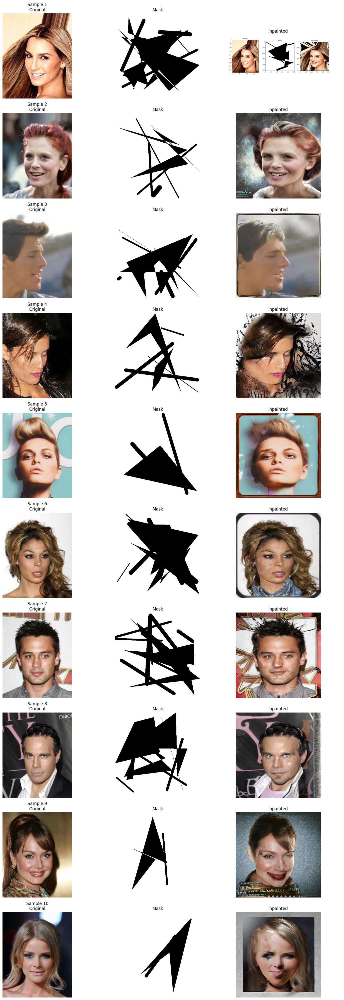

In [21]:
def visualize_results(num_samples=10):
    # Create a figure with subplots
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, num_samples*4))

    # Process first 10 samples
    for idx in range(num_samples):
        try:
            # Load original image
            orig_image = ds['train'][idx]['image']

            # Create mask
            mask = create_irregular_mask((512, 512))

            # Load inpainted result (modify this path if needed)
            result_path = f"{config['checkpoint_dir']}/result_{idx}.png"
            result_image = Image.open(result_path) if os.path.exists(result_path) else None

            # Plot original
            axes[idx, 0].imshow(orig_image)
            axes[idx, 0].set_title(f'Sample {idx+1}\nOriginal')
            axes[idx, 0].axis('off')

            # Plot mask
            axes[idx, 1].imshow(mask, cmap='gray')
            axes[idx, 1].set_title('Mask')
            axes[idx, 1].axis('off')

            # Plot inpainted
            if result_image:
                axes[idx, 2].imshow(result_image)
            else:
                # If result not saved, perform quick inference
                mask_pil = Image.fromarray(mask * 255).convert("L")
                result = pipe(
                    prompt="high quality human face portrait",
                    image=orig_image.resize((512, 512)),
                    mask_image=mask_pil,
                    num_inference_steps=20
                ).images[0]
                axes[idx, 2].imshow(result)

            axes[idx, 2].set_title('Inpainted')
            axes[idx, 2].axis('off')

        except Exception as e:
            print(f"Error visualizing sample {idx}: {str(e)}")
            continue

    plt.tight_layout()
    plt.savefig(f"{config['checkpoint_dir']}/summary_results.png")
    plt.show()

# Run visualization
visualize_results()